# CropCare AI — End-to-End Demo Notebook

**Plant Disease Detection and Treatment Advisor**

This single notebook walks through the entire computer-vision project from raw image to treatment advice. Read it top to bottom. It **imports and runs the real project modules** (the same code the backend uses) — it does not re-implement them — so what you see here is what the deployed app does.

## What you will see

1. **Datasets** — sample images from the two datasets that ship in the repo: PlantVillage (lab-controlled) and PlantDoc (field photos). The full training corpora are listed in the conclusion but gitignored for size.
2. **Digital Image Processing** — every classic DIP stage on one leaf: resolution/interpolation, intensity transforms (contrast/gamma/hist-eq), spatial filtering & unsharp, restoration (median + Wiener), colour analysis (Excess Green, lesion score), FFT, Haar wavelets.
3. **Segmentation** — six from-scratch methods (thresholding, region growing, split-and-merge, clustering, superpixels, graph cut) + a 2-of-3 consensus.
4. **Modern comparison (§4.4)** — the classical leaf mask benchmarked against **SAM** (foundation model); SAM is also what the deployed pipeline uses to isolate the leaf.
5. **Feature extraction + severity** — colour, texture, frequency, lesion shape; infected-area % and urgency.
6. **Deep-learning classifier** — the production model predicts the disease class.
7. **Hierarchical cascade** — 6 per-crop specialists refine the unified prediction via a weighted geometric-mean ensemble.
8. **Evaluation rigor (§8.6)** — 95% confidence intervals + calibration (ECE).
9. **CV vs DL comparison.**
10. **LLM explanation** — local Ollama (llama3.2:3b) turns the structured output into advice (falls back to a rule-based generator if Ollama is offline).

## How to run

```powershell
# 1. install dependencies (one time)
python -m venv .venv
.venv\Scripts\activate
pip install -r requirements.txt jupyter matplotlib httpx

# 2. (optional) SAM leaf isolation — download the checkpoint once; the pipeline
#    falls back to the classical colour mask if it is missing or CROPCARE_USE_SAM=0
#    curl -L -o ml/plant/artifacts/sam/sam_vit_b_01ec64.pth \
#      https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth

# 3. (optional, for the LLM section) start ollama and pull the model
#    ollama pull llama3.2:3b

# 4. open the notebook
jupyter notebook demo.ipynb
```

If Ollama is not running, the LLM section falls back to a rule-based explanation so the notebook still finishes.

## 0. Setup — imports and project paths

Adds the project root to `sys.path` so `from ml.plant.cv ...` works when running the notebook from the project root.

In [1]:
import json
import sys
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

PROJECT_ROOT = Path.cwd()
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

# Only the datasets that ship in this repo are previewed live below.
# The larger training corpora (augmented PlantVillage, Plant Pathology
# 2020/2021, Mendeley Tomato) are gitignored for size; see section 11 for
# the full list of data used to train the models.
DATASETS = {
    "plantvillage": PROJECT_ROOT / "datasets" / "plant" / "plantvillage" / "Plant_leave_diseases_dataset_without_augmentation",
    "plantdoc": PROJECT_ROOT / "datasets" / "plant" / "plantdoc" / "train",
}

DEMO_OUTPUT_DIR = PROJECT_ROOT / "demo_outputs"
DEMO_OUTPUT_DIR.mkdir(exist_ok=True)

plt.rcParams["figure.dpi"] = 110
plt.rcParams["image.cmap"] = "viridis"

print("project root:", PROJECT_ROOT)
for name, path in DATASETS.items():
    print(f"  {name:<25} -> {'OK ' if path.exists() else 'MISSING '} {path}")

project root: C:\Users\Admin\Desktop\School Projects\Farm Plant Disease Detection and Treatment Advisor
  plantvillage              -> OK  C:\Users\Admin\Desktop\School Projects\Farm Plant Disease Detection and Treatment Advisor\datasets\plant\plantvillage\Plant_leave_diseases_dataset_without_augmentation
  plantdoc                  -> OK  C:\Users\Admin\Desktop\School Projects\Farm Plant Disease Detection and Treatment Advisor\datasets\plant\plantdoc\train


## 1. Dataset overview

PlantVillage is the lab-controlled dataset (clean background, ~38 classes). PlantDoc is the field-photo dataset (cluttered background, harder) — this domain gap is exactly what the cascade is built to close.

We start by counting classes and previewing a few sample images from each.

In [2]:
IMAGE_SUFFIXES = {".jpg", ".jpeg", ".png", ".webp"}

def list_class_folders(dataset_path: Path) -> list[Path]:
    if not dataset_path.exists():
        return []
    return sorted(p for p in dataset_path.iterdir() if p.is_dir())

def count_images(folder: Path) -> int:
    return sum(1 for p in folder.rglob("*") if p.suffix.lower() in IMAGE_SUFFIXES)

for name, path in DATASETS.items():
    classes = list_class_folders(path)
    total = sum(count_images(c) for c in classes)
    print(f"{name:<25} {len(classes):>3} classes  {total:>6} images")

plantvillage               39 classes   55448 images
plantdoc                   28 classes    2336 images


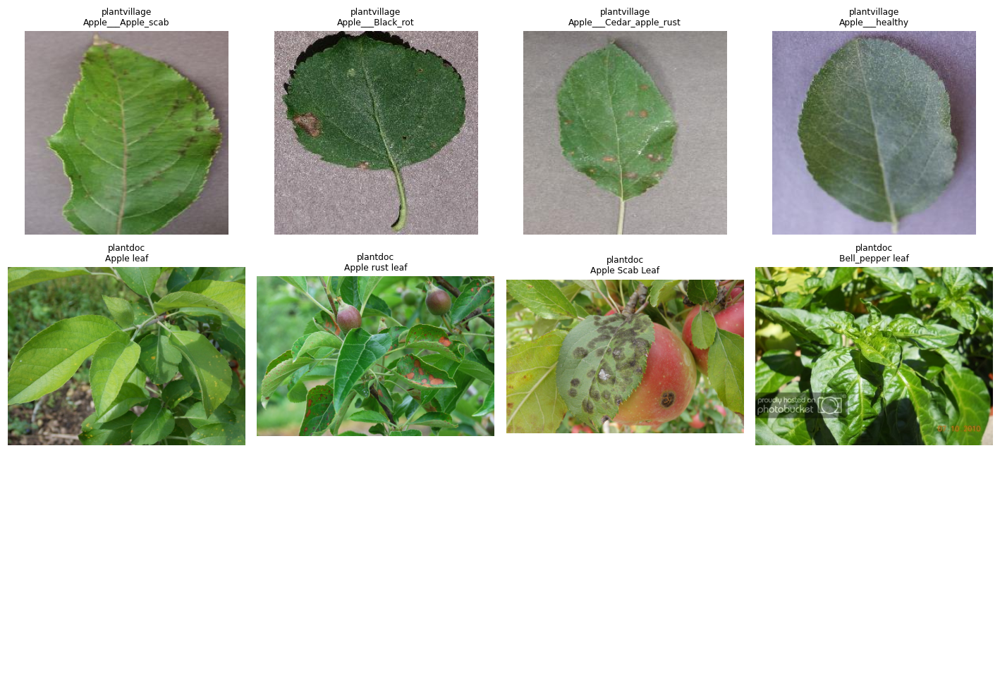

In [3]:
def first_image_in(folder: Path) -> Path | None:
    for p in folder.rglob("*"):
        if p.suffix.lower() in IMAGE_SUFFIXES:
            return p
    return None

rows = []
for name, path in DATASETS.items():
    classes = list_class_folders(path)[:4]
    for cls in classes:
        img = first_image_in(cls)
        if img is not None:
            rows.append((f"{name}\n{cls.name[:32]}", img))

fig, axes = plt.subplots(3, 4, figsize=(13, 9))
for ax, (label, img_path) in zip(axes.flat, rows[:12]):
    ax.imshow(Image.open(img_path).convert("RGB"))
    ax.set_title(label, fontsize=8)
    ax.axis("off")
for ax in axes.flat[len(rows):]:
    ax.axis("off")
plt.tight_layout()
plt.show()

## 2. Pick a sample image

We pick one diseased leaf from PlantDoc (real-world conditions) so the CV pipeline has something interesting to work on. It is **pinned to a clearly diseased PlantDoc leaf** (apple scab); change `SAMPLE_IMAGE` for a different one.

using: C:\Users\Admin\Desktop\School Projects\Farm Plant Disease Detection and Treatment Advisor\datasets\plant\plantdoc\test\Apple Scab Leaf\052609%20Hartman%20Crabapple%20scab%20single%20leaf.JPG.jpg


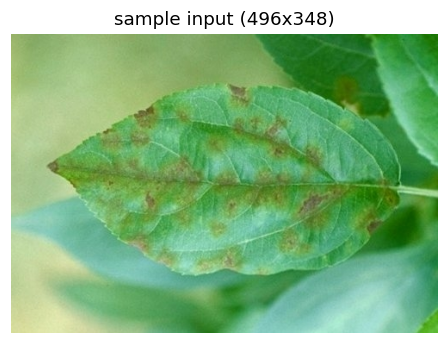

In [4]:
def find_diseased_sample() -> Path:
    candidates = []
    for path in DATASETS.values():
        for cls in list_class_folders(path):
            if "healthy" in cls.name.lower():
                continue
            img = first_image_in(cls)
            if img is not None:
                candidates.append(img)
    if not candidates:
        raise RuntimeError("no images found in any dataset")
    preferred = [p for p in candidates if "plantdoc" in str(p).lower()]
    return preferred[0] if preferred else candidates[0]

SAMPLE_IMAGE = PROJECT_ROOT / "datasets/plant/plantdoc/test/Apple Scab Leaf/052609%20Hartman%20Crabapple%20scab%20single%20leaf.JPG.jpg"
if not SAMPLE_IMAGE.exists():
    SAMPLE_IMAGE = find_diseased_sample()  # fallback
print("using:", SAMPLE_IMAGE)

sample_pil = Image.open(SAMPLE_IMAGE).convert("RGB")
plt.figure(figsize=(5, 5))
plt.imshow(sample_pil)
plt.title(f"sample input ({sample_pil.size[0]}x{sample_pil.size[1]})")
plt.axis("off")
plt.show()

## 3. Digital Image Processing pipeline

Each subsection demonstrates one DIP topic on the same image. All helpers come from `ml/common/` and `ml/plant/cv/` so the notebook reuses the exact same code the production backend uses.

### 3.1 Spatial resolution and interpolation

We resize the image to 256×256 with three interpolation methods. **Nearest** preserves pixel boundaries (blocky); **bilinear** averages 4 neighbours (smooth, our default); **bicubic** uses 16 neighbours (smoother, slightly sharper).

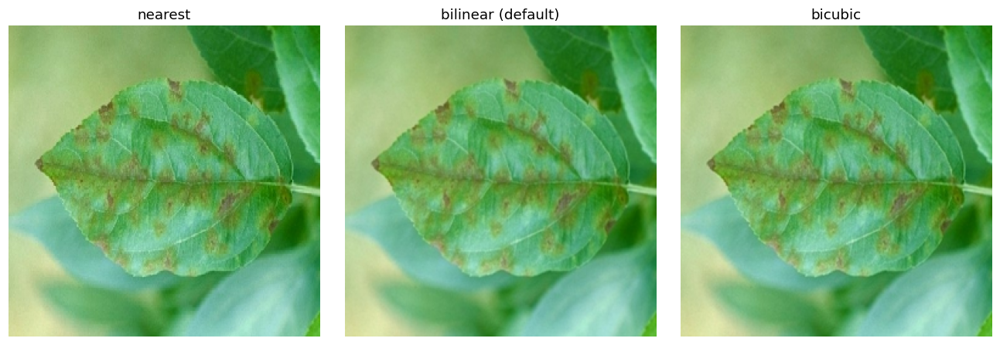

In [5]:
from ml.common.preprocessing import load_rgb_image, resize_image, to_grayscale

rgb_image = load_rgb_image(SAMPLE_IMAGE)

nearest_arr = np.asarray(resize_image(rgb_image, (256, 256), method="nearest"))
bilinear_arr = np.asarray(resize_image(rgb_image, (256, 256), method="bilinear"))
bicubic_arr = np.asarray(resize_image(rgb_image, (256, 256), method="bicubic"))

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
for ax, arr, title in zip(
    axes,
    [nearest_arr, bilinear_arr, bicubic_arr],
    ["nearest", "bilinear (default)", "bicubic"],
):
    ax.imshow(arr)
    ax.set_title(title)
    ax.axis("off")
plt.tight_layout()
plt.show()

### 3.2 Grayscale conversion and histogram

Grayscale uses the luminance formula `0.299·R + 0.587·G + 0.114·B`. The histogram shows how pixel intensities are distributed — a leaf in mid-gray (around 100–180) is normal; a heavy peak near 0 or 255 means under- or over-exposed.

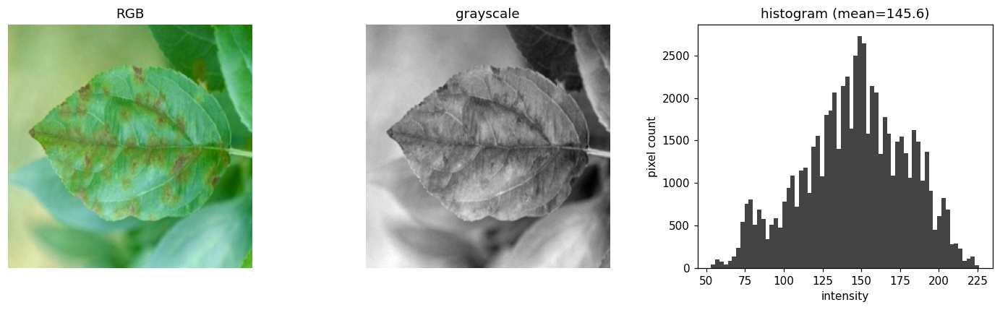

In [6]:
rgb_arr = bilinear_arr
gray_arr = np.asarray(to_grayscale(Image.fromarray(rgb_arr)), dtype=np.uint8)

fig, axes = plt.subplots(1, 3, figsize=(13, 4))
axes[0].imshow(rgb_arr); axes[0].set_title("RGB"); axes[0].axis("off")
axes[1].imshow(gray_arr, cmap="gray"); axes[1].set_title("grayscale"); axes[1].axis("off")
axes[2].hist(gray_arr.ravel(), bins=64, color="#444")
axes[2].set_title(f"histogram (mean={gray_arr.mean():.1f})")
axes[2].set_xlabel("intensity"); axes[2].set_ylabel("pixel count")
plt.tight_layout()
plt.show()

### 3.3 Intensity transformations

- **Contrast stretching** rescales intensities so the darkest pixel becomes 0 and the brightest 255.
- **Gamma correction** (γ < 1 brightens, γ > 1 darkens). We use γ = 0.9 to slightly lift midtones.
- **Histogram equalization** redistributes intensities so the cumulative histogram is roughly linear — boosts contrast in flat areas.

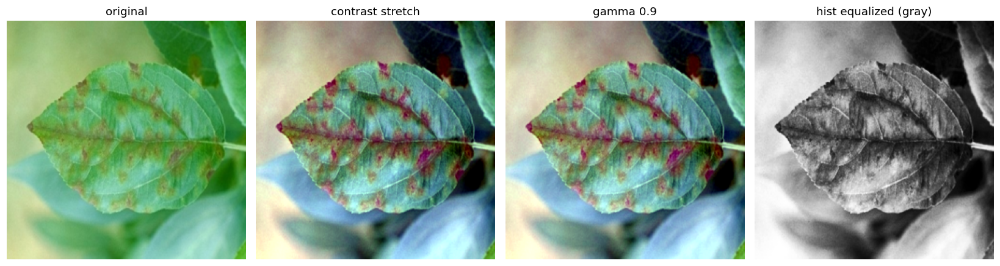

In [7]:
from ml.common.preprocessing import contrast_stretch, gamma_correction, histogram_equalize

stretched = contrast_stretch(rgb_arr)
gamma_img = gamma_correction(stretched, gamma=0.9)
equalized_gray = histogram_equalize(gray_arr)

fig, axes = plt.subplots(1, 4, figsize=(15, 4))
for ax, arr, title in zip(
    axes,
    [rgb_arr, stretched, gamma_img, equalized_gray],
    ["original", "contrast stretch", "gamma 0.9", "hist equalized (gray)"],
):
    ax.imshow(arr, cmap="gray" if arr.ndim == 2 else None)
    ax.set_title(title); ax.axis("off")
plt.tight_layout()
plt.show()

### 3.4 Spatial filtering and edge enhancement

**Unsharp mask** sharpens by subtracting a blurred version from the original: `sharp = image + amount × (image − blur)`. With σ = 1.0 and amount = 1.15 it makes lesion edges easier to segment without amplifying noise.

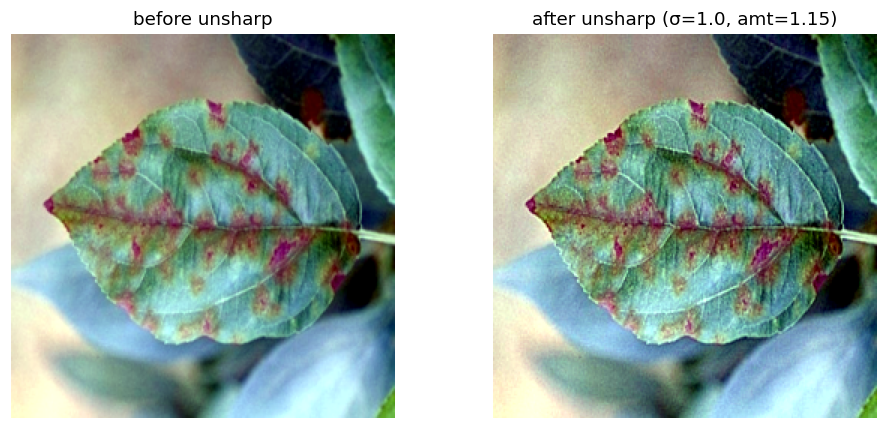

In [8]:
from ml.common.preprocessing import unsharp_mask

enhanced = unsharp_mask(gamma_img, sigma=1.0, amount=1.15)

fig, axes = plt.subplots(1, 2, figsize=(9, 4))
axes[0].imshow(gamma_img); axes[0].set_title("before unsharp"); axes[0].axis("off")
axes[1].imshow(enhanced); axes[1].set_title("after unsharp (σ=1.0, amt=1.15)"); axes[1].axis("off")
plt.tight_layout()
plt.show()

### 3.5 Image restoration (median + Wiener)

Field photos often have salt-and-pepper noise (sensor specks, dust). **Median filtering** removes outlier pixels without blurring edges. **Wiener filtering** is a mean-square-error optimal restoration assuming additive noise; we use a small 5×5 window for gentle cleanup.

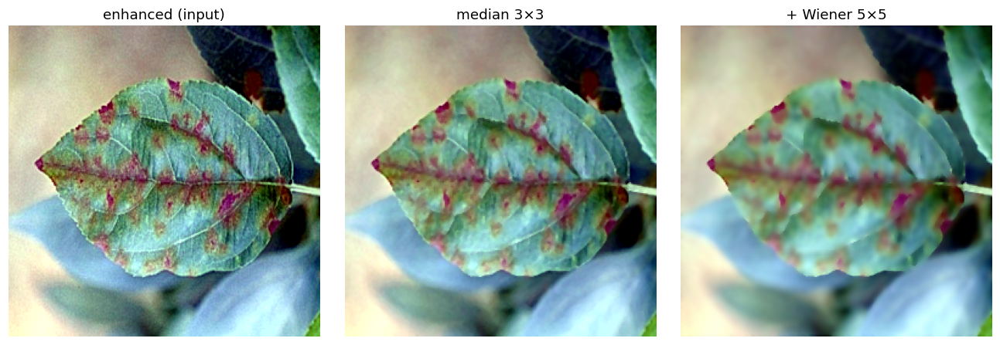

In [9]:
from ml.common.preprocessing import median_denoise, wiener_restore

median = median_denoise(enhanced, size=3)
restored = wiener_restore(median, size=5)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
for ax, arr, title in zip(
    axes,
    [enhanced, median, restored],
    ["enhanced (input)", "median 3×3", "+ Wiener 5×5"],
):
    ax.imshow(arr); ax.set_title(title); ax.axis("off")
plt.tight_layout()
plt.show()

### 3.6 Color analysis — Excess Green and lesion score

**Excess Green (ExG)** = `2·G − R − B`. It pushes green vegetation high and brown/yellow lesions low. The **lesion score** combines low ExG with brownness cues to highlight likely diseased regions.

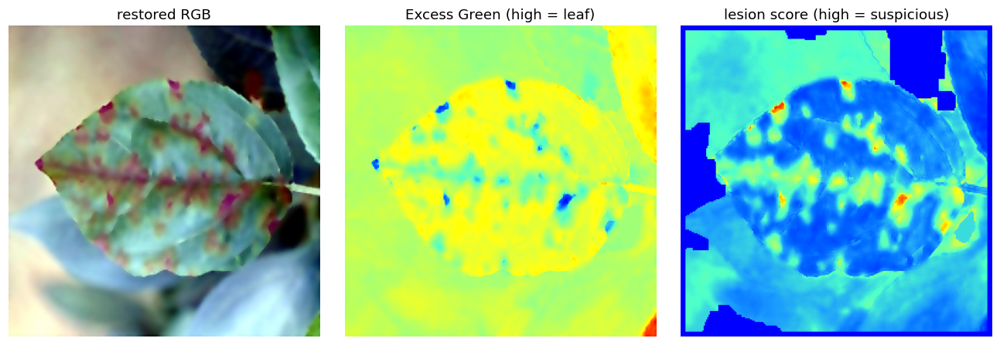

In [10]:
from ml.common.transforms import compute_excess_green
from ml.common.visualization import heatmap
from ml.plant.cv.segmentation import build_leaf_mask, lesion_score_map

leaf_mask_preview = build_leaf_mask(restored)
exg = compute_excess_green(restored)
lesion_score = lesion_score_map(restored, leaf_mask_preview)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(restored); axes[0].set_title("restored RGB"); axes[0].axis("off")
axes[1].imshow(heatmap(exg)); axes[1].set_title("Excess Green (high = leaf)"); axes[1].axis("off")
axes[2].imshow(heatmap(lesion_score)); axes[2].set_title("lesion score (high = suspicious)"); axes[2].axis("off")
plt.tight_layout()
plt.show()

### 3.7 Frequency-domain analysis (FFT)

Healthy leaves are texturally smooth (energy concentrated near the FFT center, low frequencies). Diseased patches add fine-grained structure → more high-frequency energy. We split the spectrum at radius 10% of the image and reconstruct the low-pass and high-pass images separately.

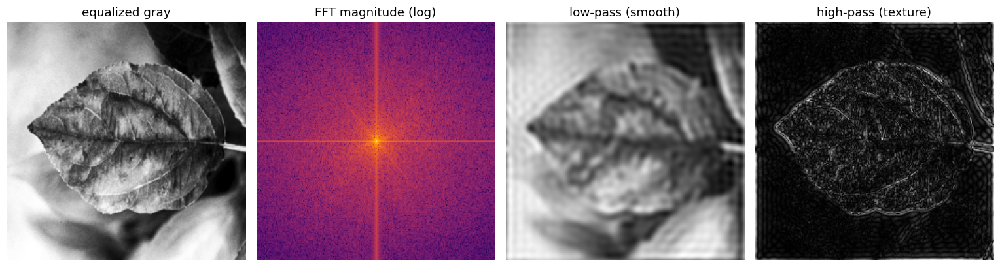

In [11]:
from ml.common.transforms import fft_magnitude_spectrum, frequency_filter

_, fft_spectrum = fft_magnitude_spectrum(equalized_gray)
freq = frequency_filter(equalized_gray, radius_ratio=0.10)

fig, axes = plt.subplots(1, 4, figsize=(14, 4))
axes[0].imshow(equalized_gray, cmap="gray"); axes[0].set_title("equalized gray"); axes[0].axis("off")
axes[1].imshow(fft_spectrum, cmap="inferno"); axes[1].set_title("FFT magnitude (log)"); axes[1].axis("off")
axes[2].imshow(freq["low_pass"], cmap="gray"); axes[2].set_title("low-pass (smooth)"); axes[2].axis("off")
axes[3].imshow(np.abs(freq["high_pass"]), cmap="gray"); axes[3].set_title("high-pass (texture)"); axes[3].axis("off")
plt.tight_layout()
plt.show()

### 3.8 Wavelet decomposition (Haar)

A single-level Haar wavelet decomposes the image into:
- **approximation (LL)** — coarse content
- **horizontal (LH)** — horizontal edges
- **vertical (HL)** — vertical edges
- **diagonal (HH)** — fine detail

Lesions usually raise the energy in HH (rough texture).

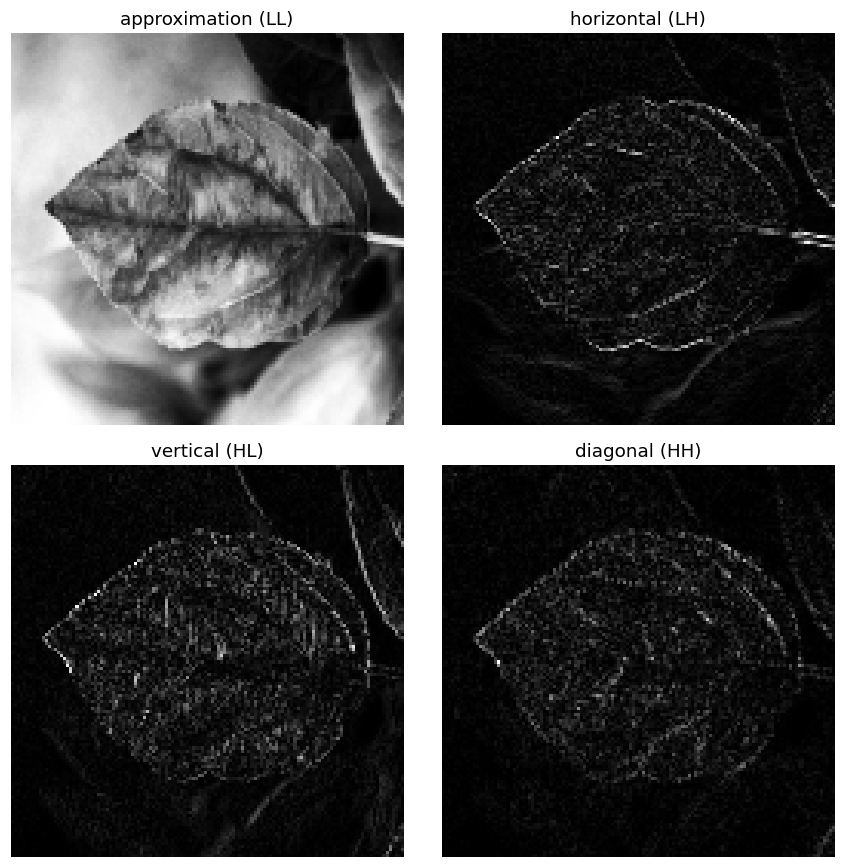

In [12]:
from ml.common.transforms import haar_wavelet_decompose

wavelet = haar_wavelet_decompose(equalized_gray)

fig, axes = plt.subplots(2, 2, figsize=(8, 8))
axes[0, 0].imshow(wavelet["approximation"], cmap="gray"); axes[0, 0].set_title("approximation (LL)")
axes[0, 1].imshow(np.abs(wavelet["horizontal"]), cmap="gray"); axes[0, 1].set_title("horizontal (LH)")
axes[1, 0].imshow(np.abs(wavelet["vertical"]), cmap="gray"); axes[1, 0].set_title("vertical (HL)")
axes[1, 1].imshow(np.abs(wavelet["diagonal"]), cmap="gray"); axes[1, 1].set_title("diagonal (HH)")
for ax in axes.flat:
    ax.axis("off")
plt.tight_layout()
plt.show()

## 4. Segmentation

Goal: produce a binary mask that flags only the diseased pixels. We try **six** methods and combine the three best with a 2-of-3 majority vote (the **consensus** mask). This is more robust than any single method.

### 4.1 Leaf mask (foreground vs background)

Before isolating lesions we isolate the leaf from soil/sky. The classical `build_leaf_mask` (shown here) uses excess-green / HSV colour cues + morphological cleanup, anchored on the connected green leaf body.

> **Deployed upgrade:** colour cannot separate a green leaf from a *green* background (field foliage, unripe fruit). The deployed pipeline (§7) therefore isolates the leaf with **SAM (Segment Anything, object-shape segmentation)** and falls back to this classical mask if SAM is unavailable (`CROPCARE_USE_SAM=0`). All lesion analysis below stays classical and from scratch.

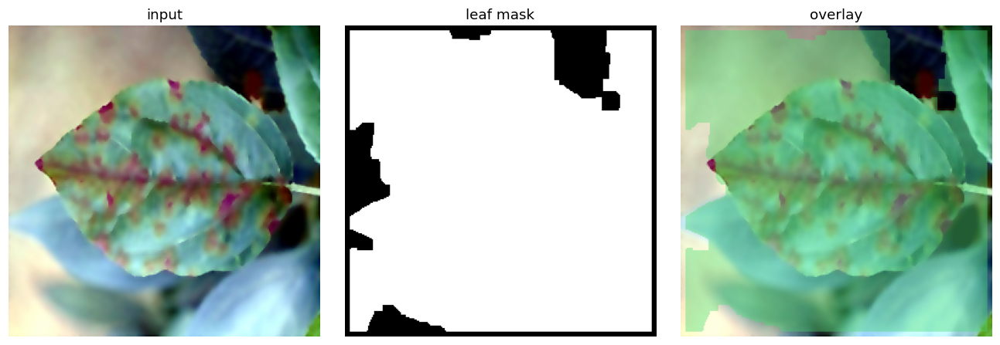

leaf covers 85.8% of the frame


In [13]:
from ml.common.visualization import overlay_mask

leaf_mask = build_leaf_mask(restored)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(restored); axes[0].set_title("input"); axes[0].axis("off")
axes[1].imshow(leaf_mask, cmap="gray"); axes[1].set_title("leaf mask"); axes[1].axis("off")
axes[2].imshow(overlay_mask(restored, leaf_mask, color=(80, 220, 120))); axes[2].set_title("overlay"); axes[2].axis("off")
plt.tight_layout()
plt.show()

leaf_coverage = leaf_mask.mean()
print(f"leaf covers {leaf_coverage * 100:.1f}% of the frame")

### 4.2 Six segmentation methods

All restricted to the leaf mask — no false lesions on the background.

| method | idea |
|---|---|
| **thresholding** | Otsu-like threshold on the lesion-score map |
| **region growing** | seed at darkest leaf pixel, grow while neighbours are similar |
| **split-and-merge** | quad-tree split on local variance, merge similar quads |
| **clustering** | K-means on colour + lesion-score + position, pick the lesion-coloured cluster |
| **superpixels** | SLIC-like grouping of pixels into perceptually uniform tiles |
| **graph cut** | min-cut on a foreground/background energy graph |

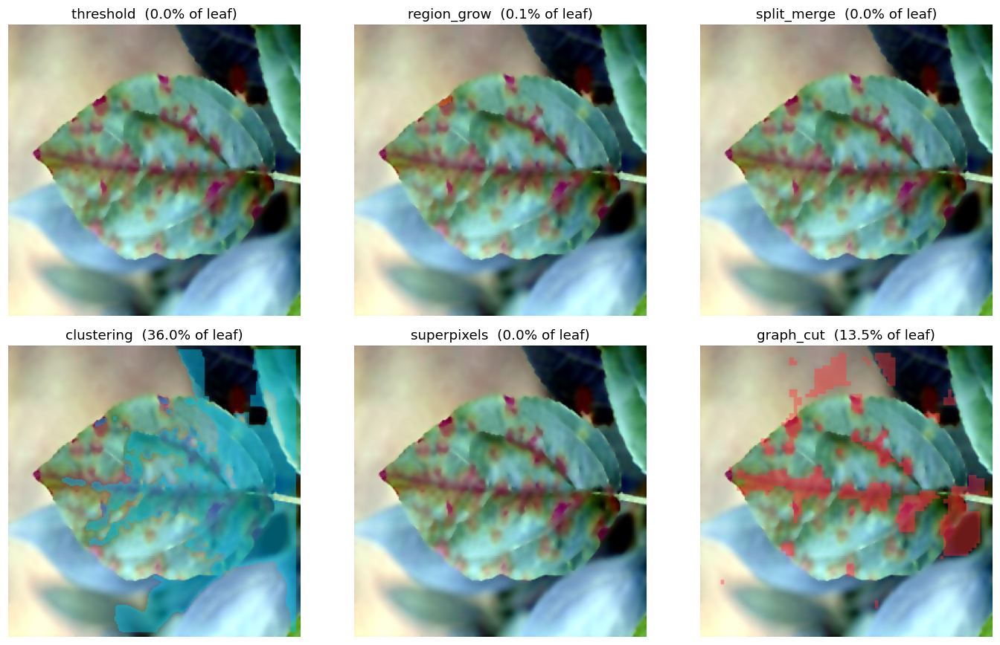

In [14]:
from ml.plant.cv.segmentation import (
    threshold_segmentation,
    region_growing_segmentation,
    split_and_merge_segmentation,
    clustering_segmentation,
    simple_superpixels,
    graph_cut_segmentation,
)

threshold_mask = threshold_segmentation(restored, leaf_mask)
region_mask = region_growing_segmentation(restored, leaf_mask)
split_merge_mask = split_and_merge_segmentation(restored, leaf_mask)
clustering_mask = clustering_segmentation(restored, leaf_mask)
_, superpixel_mask = simple_superpixels(restored, leaf_mask)
graph_cut_mask = graph_cut_segmentation(restored, leaf_mask)

methods = {
    "threshold": (threshold_mask, (255, 0, 0)),
    "region_grow": (region_mask, (255, 180, 0)),
    "split_merge": (split_merge_mask, (160, 120, 255)),
    "clustering": (clustering_mask, (0, 210, 255)),
    "superpixels": (superpixel_mask, (255, 80, 160)),
    "graph_cut": (graph_cut_mask, (255, 60, 60)),
}

fig, axes = plt.subplots(2, 3, figsize=(13, 8))
for ax, (name, (mask, color)) in zip(axes.flat, methods.items()):
    ax.imshow(overlay_mask(restored, mask, color=color))
    coverage = mask.sum() / max(leaf_mask.sum(), 1) * 100
    ax.set_title(f"{name}  ({coverage:.1f}% of leaf)")
    ax.axis("off")
plt.tight_layout()
plt.show()

### 4.3 Consensus mask (the deployed strategy)

We trust **thresholding + clustering + graph cut** as the core methods (they react to different evidence: intensity, colour, spatial coherence). A pixel is flagged if at least 2 of the 3 agree.

> The simple `votes >= 2` below is the teaching version. The **deployed** consensus (§7) adds two refinements measured on real photos: a small **spatial-tolerance** dilation before voting (so a lesion's core and halo count as agreement — recall on many-spot diseases like rust), and a **healthy-tissue colour gate** (a pixel survives only if it is off the leaf's own healthy-green tone or warm-hued — so healthy leaves don't read as diseased). §7's `analyze_plant_image` is the authoritative result.

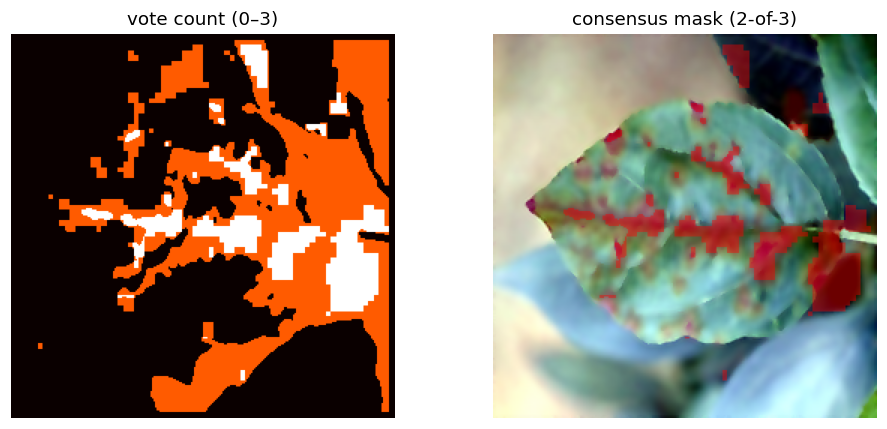

infected leaf area (consensus): 9.10%


In [15]:
core_masks = {
    "thresholding": threshold_mask,
    "clustering": clustering_mask,
    "graph_cut": graph_cut_mask,
}
votes = np.stack([m.astype(np.uint8) for m in core_masks.values()], axis=0).sum(axis=0)
consensus_mask = (votes >= 2) & leaf_mask

fig, axes = plt.subplots(1, 2, figsize=(9, 4))
axes[0].imshow(votes, cmap="hot"); axes[0].set_title("vote count (0–3)"); axes[0].axis("off")
axes[1].imshow(overlay_mask(restored, consensus_mask, color=(255, 0, 0)))
axes[1].set_title("consensus mask (2-of-3)"); axes[1].axis("off")
plt.tight_layout()
plt.show()

infected_pct = consensus_mask.sum() / max(leaf_mask.sum(), 1) * 100
print(f"infected leaf area (consensus): {infected_pct:.2f}%")

### 4.4 Modern comparison — classical leaf segmentation vs. SAM

To position the from-scratch CV against the current frontier, the classical leaf mask is benchmarked against a foundation model (**Segment Anything, ViT-B**), prompted with the classical pipeline's own leaf box. Across one field image per crop the hand-built mask agrees with SAM at **mean IoU 0.67 / Dice 0.77** (grape is the hard case — dense overlapping leaves). SAM is also what the deployed pipeline now uses to *isolate* the leaf (§4.1, §7), while all lesion analysis stays classical. Reproduce with `scripts/compare_sam_vs_classical.py`.

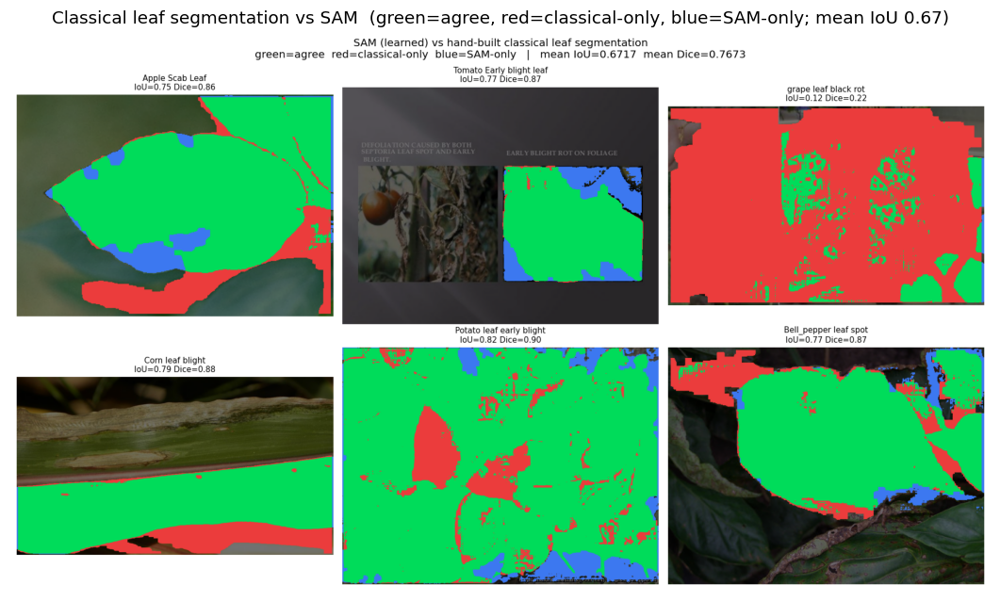

In [16]:
sam_montage = PROJECT_ROOT / "ml/plant/artifacts/reports/sam_vs_classical/00_montage_sam_vs_classical.png"
if sam_montage.exists():
    plt.figure(figsize=(13, 7))
    plt.imshow(Image.open(sam_montage))
    plt.title("Classical leaf segmentation vs SAM  (green=agree, red=classical-only, blue=SAM-only; mean IoU 0.67)")
    plt.axis("off")
    plt.show()
else:
    print("run: python scripts/compare_sam_vs_classical.py  to generate this figure")

## 5. Feature extraction

Once we have a stable lesion mask, we measure properties the classifier and report can use: lesion brownness, texture entropy, frequency ratios, wavelet energies, segmentation agreement.

In [17]:
from ml.plant.cv.features import extract_feature_bundle

features = extract_feature_bundle(
    image_array=restored,
    leaf_mask=leaf_mask,
    lesion_mask=consensus_mask,
    gray_array=equalized_gray,
    frequency_data=freq,
    wavelet_data=wavelet,
    segmentation_masks=core_masks,
)

print(json.dumps({k: v for k, v in features.items()}, indent=2, default=float))

{
  "leaf_color": {
    "mean_r": 125.00569152832031,
    "mean_g": 151.17237854003906,
    "mean_b": 139.5881805419922,
    "std_r": 54.990638732910156,
    "std_g": 54.45708465576172,
    "std_b": 56.67062759399414
  },
  "lesion_color": {
    "mean_r": 73.96578216552734,
    "mean_g": 55.16679763793945,
    "mean_b": 54.12025833129883,
    "std_r": 45.819435119628906,
    "std_g": 33.8425407409668,
    "std_b": 31.39599609375
  },
  "texture": {
    "contrast": 1.0075918995863848,
    "homogeneity": 0.7738551910367878,
    "energy": 0.026622914765764998,
    "entropy": 5.6925671727669265
  },
  "lesion_texture": {
    "contrast": 0.6850642511059617,
    "homogeneity": 0.8014043957587247,
    "energy": 0.1084545364298026,
    "entropy": 3.9171914143462736
  },
  "shape": {
    "lesion_area_ratio": 0.09099320308885805,
    "perimeter_pixels": 1241.0,
    "component_count": 23.0,
    "dominant_component_ratio": 0.352170512319124,
    "compactness": 23.964753999991128
  },
  "indices": 

## 6. Severity estimation

We label connected components of the consensus mask, draw bounding boxes, and rank by area. The largest component plus total infected % drive the severity level.

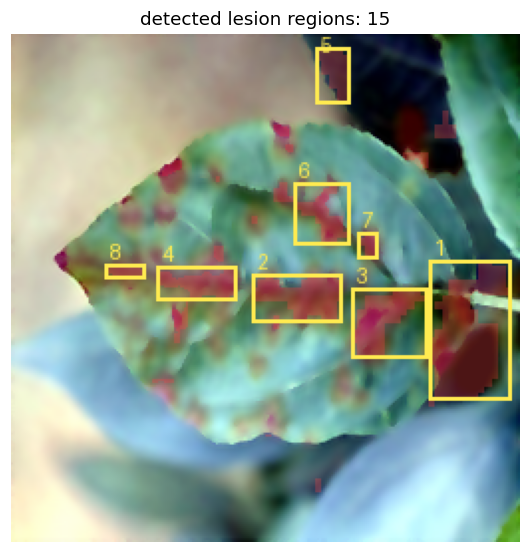

largest region: 3.2% of leaf
total infected: 9.10% of leaf
severity level: moderate


In [18]:
from scipy import ndimage
from PIL import ImageDraw

labeled, n_components = ndimage.label(consensus_mask & leaf_mask)
regions = []
for i in range(1, n_components + 1):
    comp = (labeled == i)
    area = int(comp.sum())
    if area < 30:
        continue
    ys, xs = np.where(comp)
    regions.append({
        "area": area,
        "bbox": (int(xs.min()), int(ys.min()), int(xs.max()), int(ys.max())),
        "area_pct_of_leaf": round(area / max(leaf_mask.sum(), 1) * 100, 2),
    })
regions.sort(key=lambda r: r["area"], reverse=True)

annotated = overlay_mask(restored, consensus_mask, color=(255, 70, 70), alpha=0.3)
pil_annot = Image.fromarray(annotated)
draw = ImageDraw.Draw(pil_annot)
for idx, r in enumerate(regions[:8], 1):
    x1, y1, x2, y2 = r["bbox"]
    draw.rectangle((x1, y1, x2, y2), outline=(255, 235, 80), width=2)
    draw.text((x1 + 3, max(0, y1 - 12)), str(idx), fill=(255, 235, 80))

plt.figure(figsize=(6, 6))
plt.imshow(pil_annot)
plt.title(f"detected lesion regions: {len(regions)}")
plt.axis("off")
plt.show()

if regions:
    print(f"largest region: {regions[0]['area_pct_of_leaf']}% of leaf")
    print(f"total infected: {infected_pct:.2f}% of leaf")

if infected_pct < 4:
    severity = "healthy or mild"
elif infected_pct < 15:
    severity = "moderate"
else:
    severity = "severe"
print(f"severity level: {severity}")

## 7. Full pipeline (one-shot call) — the authoritative deployed path

Everything above is wrapped in a single function `analyze_plant_image()`, which the backend calls. Unlike the teaching cells above, this is the **real deployed pipeline**: SAM-assisted leaf isolation (classical fallback) + the dilated 2-of-3 consensus with the healthy-tissue gate. It returns a JSON-ready dict and saves all intermediate images to disk for the report.

In [19]:
from ml.plant.cv.analysis_pipeline import analyze_plant_image

analysis = analyze_plant_image(SAMPLE_IMAGE, DEMO_OUTPUT_DIR / "pipeline_run")

print("=== summary ===")
print(json.dumps(analysis["summary"], indent=2))
print(f"\nsaved {len(analysis['outputs'])} intermediate images to: {DEMO_OUTPUT_DIR / 'pipeline_run'}")

=== summary ===
{
  "predicted_crop": "apple",
  "health_status": "diseased",
  "predicted_disease": "leaf_spot_like_pattern",
  "confidence_score": 0.806,
  "severity_level": "high",
  "urgency_level": "high",
  "infected_area_percentage": 13.02
}

saved 27 intermediate images to: C:\Users\Admin\Desktop\School Projects\Farm Plant Disease Detection and Treatment Advisor\demo_outputs\pipeline_run


## 8. Deep-learning classifier

The CV pipeline gives a numerical severity but only a heuristic disease guess. The trained PyTorch model (`ml/plant/artifacts/production/best_model.pt`) takes the leaf crop and predicts one of **27 disease classes across 6 crops** (21 diseases + 6 healthy).

Its confidence is the model's **raw softmax probability — _not_ calibrated**: we measured Expected Calibration Error = **0.207** on field photos (the model is overconfident under domain shift), so we treat it as a routing / "uncertain" signal rather than a literal probability. See §8.6 for the calibration and confidence-interval evidence.

In [20]:
from ml.plant.dl.infer import predict
from ml.plant.dl.classifier.paths import PRODUCTION_MODEL_PATH

if PRODUCTION_MODEL_PATH.exists():
    dl_result = predict(
        Path(SAMPLE_IMAGE),
        PRODUCTION_MODEL_PATH,
        threshold=0.65,
        tta_passes=2,
    )
    print("=== DL prediction ===")
    print(json.dumps({
        "predicted_label": dl_result["predicted_label"],
        "crop": dl_result["crop"],
        "disease": dl_result["disease"],
        "is_healthy": dl_result["is_healthy"],
        "confidence": round(dl_result["confidence"], 3),
        "health_status": dl_result["health_status"],
        "top_predictions": [
            {"label": p["label"], "prob": round(p["probability"], 3)}
            for p in dl_result["top_predictions"]
        ],
    }, indent=2))
else:
    print("production model not found — train one with `python ml/plant/dl/train.py` or skip this section")
    dl_result = None

C:\Users\Admin\Desktop\School Projects\Farm Plant Disease Detection and Treatment Advisor\ml\plant\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


=== DL prediction ===
{
  "predicted_label": "apple__apple_scab",
  "crop": "apple",
  "disease": "apple_scab",
  "is_healthy": false,
  "confidence": 0.999,
  "health_status": "diseased",
  "top_predictions": [
    {
      "label": "apple__apple_scab",
      "prob": 0.999
    },
    {
      "label": "tomato__leaf_mold",
      "prob": 0.001
    },
    {
      "label": "potato__late_blight",
      "prob": 0.0
    }
  ]
}


## 8.5 Hierarchical cascade — unified + per-crop specialists with ensemble

The unified DL classifier above sees 27 disease classes across 6 crops with limited per-crop capacity. To improve each crop specifically, we trained 6 **per-crop specialists** with `--crop-filter <crop>` using `field_heavy` augmentation + focal loss + a 5x boost on field samples. Each specialist sees only its own crop's classes, so it can devote more capacity to fine disease distinctions.

**Cascade strategy:**

1. Run the unified model to identify the crop.
2. If the crop has a registered specialist AND unified confidence > 0.5, run the specialist on the same image.
3. **Ensemble** specialist + unified (restricted to that crop's labels) with a weighted geometric mean (specialist 0.7, unified 0.3).
4. Use the ensembled distribution's argmax as the final prediction.

This is hierarchical specialization plus model ensembling. Net effect on the cross-crop PlantDoc field test (177 supported-crop images):

| Setup | Accuracy (95% CI) |
|---|---|
| Unified only (open-set gate active) | 24.29% [18.6–31.1%] |
| **Cascade with 6 specialists (live)** | **58.76%** [51.4–65.7%]  (+34.5 pts) |

The two confidence intervals **do not overlap**, so the cascade improvement is statistically significant, not sampling noise (Wilson + bootstrap; see §8.6).

Per-crop field accuracy (cascade vs unified-only baseline on same images):

| crop | unified only | cascade + specialist |
|---|---|---|
| grape | 20.0% | **90.0%** |
| pepper | 17.6% | **70.6%** |
| apple | 48.3% | **82.8%** |
| tomato | 8.7% | **40.6%** |
| potato | 6.2% | **25.0%** |
| corn | 57.7% | **69.2%** |

Full numbers in [ml/plant/artifacts/reports/cross_crop_cascade_eval.json](ml/plant/artifacts/reports/cross_crop_cascade_eval.json).

In [21]:
from ml.plant.dl.cascade import cascade_predict

CHECKPOINT_DIR = PROJECT_ROOT / "ml" / "plant" / "artifacts" / "checkpoints"
SPECIALIST_CROPS = ["apple", "tomato", "grape", "corn", "pepper", "potato"]

specialists = {}
for crop in SPECIALIST_CROPS:
    candidate = CHECKPOINT_DIR / f"{crop}_specialist.pt"
    if candidate.exists():
        specialists[crop] = candidate
print(f"specialists registered: {sorted(specialists)}")

if PRODUCTION_MODEL_PATH.exists():
    cascade_result = cascade_predict(
        Path(SAMPLE_IMAGE),
        PRODUCTION_MODEL_PATH,
        specialists,
        threshold=0.65,
        routing_threshold=0.50,
        tta_passes=4,
    )
    print()
    print(f"cascade_used:  {cascade_result['cascade_used']}")
    print(f"cascade_route: {cascade_result['cascade_route']}")
    print()
    u = cascade_result['unified_prediction']
    print(f"UNIFIED:    label={u.get('predicted_label')}  matched_crop={u.get('matched_supported_crop')}  conf={u.get('confidence', 0):.4f}")
    s = cascade_result.get('specialist_prediction')
    if s:
        print(f"SPECIALIST: label={s.get('predicted_label')}  crop={s.get('crop')}  conf={s.get('confidence', 0):.4f}")
    e = cascade_result.get('ensemble_prediction')
    if e:
        print(f"ENSEMBLE:   label={e.get('predicted_label')}  conf={e.get('confidence', 0):.4f}  (weights spec_total={e.get('specialist_total_weight')} unified={e.get('unified_weight')})")
    print()
    print(f"FINAL:      label={cascade_result['predicted_label']}  crop={cascade_result['crop']}  disease={cascade_result['disease']}  conf={cascade_result['confidence']:.4f}")
else:
    cascade_result = None
    print("production model not found - skipped")


specialists registered: ['apple', 'corn', 'grape', 'pepper', 'potato', 'tomato']



cascade_used:  True
cascade_route: ensemble_apple_1_specialist_plus_unified

UNIFIED:    label=unknown_leaf_crop  matched_crop=apple  conf=0.9995
SPECIALIST: label=apple__apple_scab  crop=apple  conf=0.9992
ENSEMBLE:   label=apple__apple_scab  conf=0.9999  (weights spec_total=0.7 unified=0.3)

FINAL:      label=apple__apple_scab  crop=apple  disease=apple_scab  conf=0.9999


## 8.6 Evaluation rigor — confidence intervals & calibration

Two checks that separate a class project from a portfolio demo:

- **95% confidence intervals** (Wilson, small-n appropriate; bootstrap-confirmed). The cascade's field interval **[51.4–65.7%]** sits entirely above the unified model's **[18.6–31.1%]** → the +34.5-point gain is statistically significant, not noise.
- **Calibration.** Expected Calibration Error = **0.207** on the 177 field images — the model is **overconfident** under domain shift (every reliability bar sits below the diagonal). This is why the displayed confidence is treated as a guidance signal, not a literal probability; post-hoc temperature scaling is the planned fix.

Reproduce with `scripts/compute_statistical_rigor.py`.

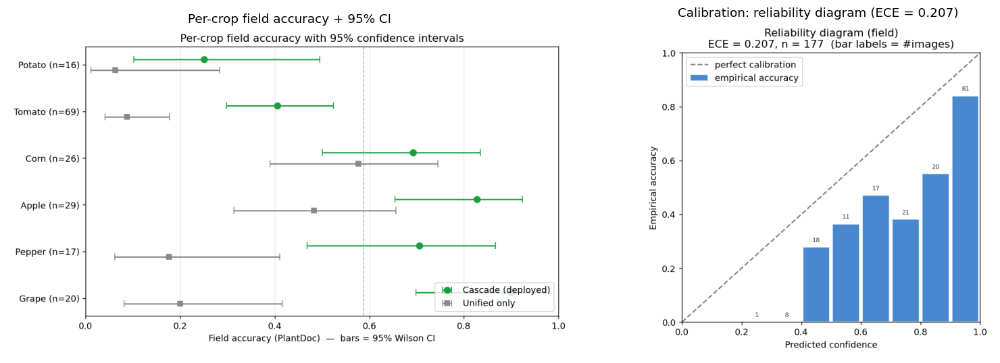

In [22]:
ci_fig = PROJECT_ROOT / "ml/plant/artifacts/reports/figures/cross_crop_accuracy_ci.png"
rel_fig = PROJECT_ROOT / "ml/plant/artifacts/reports/figures/reliability_diagram.png"
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
for ax, path, title in zip(
    axes, [ci_fig, rel_fig],
    ["Per-crop field accuracy + 95% CI", "Calibration: reliability diagram (ECE = 0.207)"],
):
    if path.exists():
        ax.imshow(Image.open(path)); ax.set_title(title)
    else:
        ax.text(0.5, 0.5, "run scripts/compute_statistical_rigor.py", ha="center")
    ax.axis("off")
plt.tight_layout()
plt.show()

## 9. CV vs DL comparison

CV is **explainable** (we can show why) but uses heuristics for the disease name. DL gives the disease name with class probabilities (**uncalibrated** — see §8.6) but is a black box. Combining them is more robust than either alone.

In [23]:
cv_summary = analysis["summary"]

print(f"{'':<25}{'CV pipeline':<32}{'DL classifier'}")
print("-" * 75)
print(f"{'predicted crop:':<25}{str(cv_summary['predicted_crop']):<32}{(dl_result['crop'] if dl_result else 'n/a')}")
print(f"{'health status:':<25}{cv_summary['health_status']:<32}{(dl_result['health_status'] if dl_result else 'n/a')}")
print(f"{'disease:':<25}{str(cv_summary['predicted_disease']):<32}{(dl_result['disease'] if dl_result else 'n/a')}")
print(f"{'confidence:':<25}{cv_summary['confidence_score']:<32}{(round(dl_result['confidence'], 3) if dl_result else 'n/a')}")
print(f"{'infected area %:':<25}{cv_summary['infected_area_percentage']:<32}{'(CV-only — DL does not localize)'}")
print(f"{'severity:':<25}{cv_summary['severity_level']:<32}{'(derived from CV mask)'}")

                         CV pipeline                     DL classifier
---------------------------------------------------------------------------
predicted crop:          apple                           apple
health status:           diseased                        diseased
disease:                 leaf_spot_like_pattern          apple_scab
confidence:              0.806                           0.999
infected area %:         13.02                           (CV-only — DL does not localize)
severity:                high                            (derived from CV mask)


## 10. LLM explanation (Ollama llama3.2:3b)

The structured CV+DL output is fed to a local Ollama LLM that turns it into farmer-friendly language: what happened, likely cause, treatment steps, prevention tips, urgency.

If Ollama isn't running, we fall back to the rule-based explanation generator (same one the backend uses).

In [24]:
import httpx
from ml.plant.llm.explainer import (
    build_prompt_context,
    build_response_schema,
    build_system_prompt,
    build_user_prompt,
    build_fallback_payload,
    normalize_advisory_payload,
    compose_advisory_text,
)

OLLAMA_URL = "http://localhost:11434"
OLLAMA_MODEL = "llama3.2:3b"

crop = (dl_result["crop"] if dl_result else cv_summary["predicted_crop"]) or "unknown_leaf_crop"
disease = (dl_result["disease"] if dl_result else cv_summary["predicted_disease"])
health_status = cv_summary["health_status"]
confidence = (dl_result["confidence"] if dl_result else cv_summary["confidence_score"])
severity_level = cv_summary["severity_level"]
urgency_level = cv_summary["urgency_level"]

context = build_prompt_context(
    analysis,
    crop=crop, disease=disease, health_status=health_status,
    confidence=confidence, severity=severity_level, urgency=urgency_level,
    farm_notes="warm and humid week",
)
fallback = build_fallback_payload(
    crop=crop, disease=disease, health_status=health_status,
    confidence=confidence, severity=severity_level, urgency=urgency_level,
    infected_area_percentage=cv_summary["infected_area_percentage"],
    farm_notes="warm and humid week",
)

explanation = None
source = "fallback"
try:
    with httpx.Client(timeout=60.0) as client:
        response = client.post(
            f"{OLLAMA_URL}/api/generate",
            json={
                "model": OLLAMA_MODEL,
                "system": build_system_prompt(),
                "prompt": build_user_prompt(context),
                "format": build_response_schema(),
                "stream": False,
                "keep_alive": "10m",
                "options": {"temperature": 0.2, "num_predict": 340},
            },
        )
        response.raise_for_status()
        raw = response.json().get("response", "").strip()
        parsed = json.loads(raw) if raw else {}
        explanation = normalize_advisory_payload(parsed, fallback)
        source = f"ollama / {OLLAMA_MODEL}"
except Exception as exc:
    print(f"[ollama unavailable: {exc}] using rule-based fallback instead")
    explanation = fallback

print(f"=== explanation source: {source} ===\n")
print(json.dumps(explanation, indent=2))
print("\n=== farmer-friendly text ===")
print(compose_advisory_text(explanation))

[ollama unavailable: Unterminated string starting at: line 22 column 3 (char 1636)] using rule-based fallback instead
=== explanation source: fallback ===

{
  "what_happened": "The apple leaf appears diseased with about 100% confidence. Around 13.02% of the visible leaf area looks affected.",
  "likely_cause": "The most likely cause is apple_scab. Humid conditions can make this kind of problem spread more easily.",
  "severity_summary": "This looks high and needs high attention.",
  "why_it_matters": "Acting early helps limit spread and protect healthy leaf area.",
  "treatment_steps": [
    "Check nearby leaves for similar symptoms.",
    "Remove or isolate clearly affected leaf material if it is safe to do so.",
    "Use a crop-safe treatment only after matching it to the likely issue."
  ],
  "action_explanations": [
    "Nearby inspection helps you see whether the issue is spreading.",
    "Removing infected tissue can reduce further spread.",
    "Using the right treatment avoids

## 11. Conclusion

This notebook ran the full CropCare AI pipeline end-to-end on a single image:

1. **DIP** — resolution / interpolation, intensity transforms, spatial filtering, restoration, color analysis, FFT, wavelets
2. **Segmentation** — six from-scratch methods + 2-of-3 consensus. Deployed path adds **SAM-assisted leaf isolation** (so green-on-green field backgrounds are handled), a **spatial-tolerance vote**, and a **healthy-tissue colour gate** (recall on many-spot diseases, precision on healthy leaves)
3. **Feature extraction + severity** — measurable properties of the lesion
4. **Deep-learning classifier** — disease label with **uncalibrated** confidence (ECE 0.207 on field data; treated as a guidance signal)
5. **Hierarchical cascade + ensemble** — 6 per-crop specialists (apple, tomato, grape, corn, pepper, potato) plus weighted geometric-mean ensemble with the unified model. Cross-crop PlantDoc field accuracy: 24.29% (unified only) → **58.76% (live cascade)**, 95% CIs non-overlapping (statistically significant); apple specifically: 48.3% → **82.8%**
6. **Evaluation rigor** — 95% confidence intervals, calibration (ECE), and a classical-vs-SAM segmentation benchmark (mean IoU 0.67)
7. **LLM explanation** — local Ollama turns the numbers into actionable advice

The same code paths used here power the FastAPI backend and the React frontend, so the demo represents what the deployed app actually does. Full measured numbers are in the project README and in [ml/plant/artifacts/reports/](ml/plant/artifacts/reports/).

### Datasets used to train the DL components

| dataset | role | size |
|---|---|---|
| PlantVillage (lab) | base disease classes | ~50k |
| PlantVillage-augmented | augmented lab variants | ~30k |
| PlantDoc (field) | field photos for stage 2 fine-tune and field test | ~2.3k |
| Plant Pathology 2020 (Kaggle FGVC7) | real apple field photos | ~3k single-label |
| Plant Pathology 2021 (Kaggle FGVC8) | real apple field photos | ~11k single-label |
| Mendeley Tomato Leaves | tomato lab + Taiwan field | ~20k extracted |

(Only PlantVillage and PlantDoc ship in the repo; the rest are gitignored for size.)

### Where to look next

- `ml/plant/cv/analysis_pipeline.py` — the production CV pipeline (SAM-assisted isolation + 2-of-3 consensus + healthy-tissue gate)
- `ml/plant/cv/sam_leaf.py` — optional SAM leaf isolation with classical fallback
- `ml/plant/dl/cascade.py` — the hierarchical cascade and weighted geometric-mean ensemble
- `scripts/compute_statistical_rigor.py` — confidence intervals + calibration
- `scripts/compare_sam_vs_classical.py` — classical-vs-SAM segmentation benchmark
- `ml/plant/dl/evaluate.py` — evaluation entry point; measured numbers saved under `ml/plant/artifacts/reports/`
- `backend/app/services/inference_service.py` — how the backend orchestrates everything
- `docs/work_history.md` — start-to-finish project history